In [1]:
"""
Flat Dynamic run for PSSE, the following code is used to run a dynamic simulation of IEEE 14 bus system
"""

'\nFlat Dynamic run for PSSE, the following code is used to run a dynamic simulation of IEEE 14 bus system\n'

In [13]:
"""
Imports 
"""
import WEC_GRID as wg  # import the WEC-GRID software
import numpy as np
import pandas as pd


WecObj = wg.Wec_grid(
    "../models/grid_models/andes_IEEE14.raw"
)  # initialize Object with Grid file (figure 1)

WecObj.initalize_psse("fnsl")  # initalize PSSe with solver


 Reading IC, SBASE, REV, XFRRAT, NXFRAT, BASFRQ...

 Converting RAW data from PSS(R)E 32 to PSS(R)E 33 format
 Starting processing of Case identification data records
 Finished processing of 3 records for Case identification data
 Starting processing of Bus data records
 Finished processing of 14 records for Bus data
 Starting processing of Load data records
 Finished processing of 11 records for Load data
 Starting processing of Fixed shunt data records
 Finished processing of 0 records for Fixed shunt data
 Starting processing of Generator data records
 Finished processing of 5 records for Generator data
 Starting processing of Branch data records
 Finished processing of 16 records for Branch data
 Starting processing of Transformer data records
 Finished processing of 16 records for 4 Transformer data
 Starting processing of Area data records
 Finished processing of 2 records for Area data
 Starting processing of Two-terminal dc data records
 Finished processing of 0 records for 0 

In [2]:
WecObj.psse.run_powerflow("fnsl")


  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.0001(      8     )    0.0000(      9     )
                                                             0.03136(     12     )   0.00278(      2     )
   1         0.0008(      6     )    0.1542(      2     )
                                                             0.02359(      6     )   0.00239(      6     )
   2         0.0006(      6     )    0.0514(      3     )
                                                             0.01062(      8     )   0.00226(      3     )
   3         0.0001(      8     )    0.0005(      3     )


 Reached tolerance in 3 iterations

 Largest mismatch:     -0.00 MW      0.05 Mvar      0.05 MVA at bus 3 [BUS3        69.000]
 System total absolute mismatch:                    0.10 MVA

 SWING BUS SUMMARY:
   BUS#-SCT X-- NAME --X BASKV      PGEN     PMAX    PMIN      QGEN     QMAX    QMIN
      1     BUS1        69.000      81.4    200.

1

In [ ]:
# voltage mult and angle should be exactly the same
# something is super off
# angle degree v.s rad ?
# center of inertia for reference. the angle could be reference to 0 (slacj bus), delta, sometimes those delta are not referenced to slack bus to as internal angles
# check on these two ^^^

In [3]:
WecObj.psse.dataframe

,BUS_ID,Bus,BASE,PU,ANGLE,Type,P Gen,Q Gen,P Load,Q Load,P,Q,ΔP,ΔQ,M_Angle,M_Mag
0,1,BUS 1,69.0,1.030000,0.000000,3,81.448387,1.877563,NaN,NaN,81.448387,1.877563,-0.000003,-1.862645e-07,0.000003,-3.079174
1,2,BUS 2,69.0,1.019732,-0.027993,2,40.000000,15.000001,21.700001,12.700001,18.299999,2.300000,-0.006869,-1.229346e-05,0.006869,-3.139803
2,3,BUS 3,69.0,1.000516,-0.060129,2,40.000000,15.000001,50.000000,25.000000,-10.000000,-9.999999,0.004530,-5.148426e-02,0.051683,-1.483035
3,4,BUS 4,69.0,0.998643,-0.074740,1,NaN,NaN,47.799999,10.000000,-47.799999,-10.000000,-0.004336,8.419156e-04,0.004417,2.949821
4,5,BUS 5,69.0,1.004482,-0.064333,1,NaN,NaN,7.600000,1.600000,-7.600000,-1.600000,-0.000459,5.245209e-04,0.000697,2.289626
5,6,BUS 6,138.0,0.998789,-0.109977,2,30.000002,10.000000,15.000001,7.500000,15.000001,2.500000,0.001605,-2.754340e-03,0.003188,-1.043221
6,7,BUS 7,138.0,1.006917,-0.084314,1,NaN,NaN,NaN,NaN,NaN,NaN,-0.002089,3.185123e-05,0.002089,3.126345
7,8,BUS 8,69.0,1.019064,-0.024405,2,35.000000,10.000000,NaN,NaN,35.000000,10.000000,0.009462,-1.539513e-02,0.018071,-1.019692
8,9,BUS 9,138.0,1.002023,-0.127518,1,NaN,NaN,29.499998,16.600000,-29.499998,-16.600000,-0.005773,-2.037734e-03,0.006122,-2.802253
9,10,BUS 10,138.0,0.993597,-0.130213,1,NaN,NaN,9.000000,5.800000,-9.000000,-5.800000,-0.001428,-1.132488e-04,0.001432,-3.062427


In [4]:
WecObj.psse.run_dynamics(dyr_file="../models/grid_models/andes_IEEE14.dyr")

 Out of file data--switch to terminal input mode

 Generator models use:
  CONS         1-     70
  STATES       1-     30

 Stabilizer models use:
  CONS        71-    119
  STATES      31-     49
  VARS         1-     12
  ICONS        1-     10

 Excitation System models use:
  CONS       120-    215
  STATES      50-     69

 Turbine Governor models use:
  CONS       216-    276
  STATES      70-     87
  VARS        13-     19


 SUMMARY OF MODELS READ:

 GENS:  GENROU
           5

 STABS: IEEEST           ST2CUT
           1                2

 EXSYS: EXST1            ESST3A
           1                4

 GOVS:  TGOV1            IEEEG1
           3                2

 NEXT AVAILABLE ADDRESSES ARE:
     CON   STATE     VAR    ICON
     277      88      20      11

 Only PSSE supplied models in case. Compilation is not required

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.0001(      8     )    0.0000(      9  

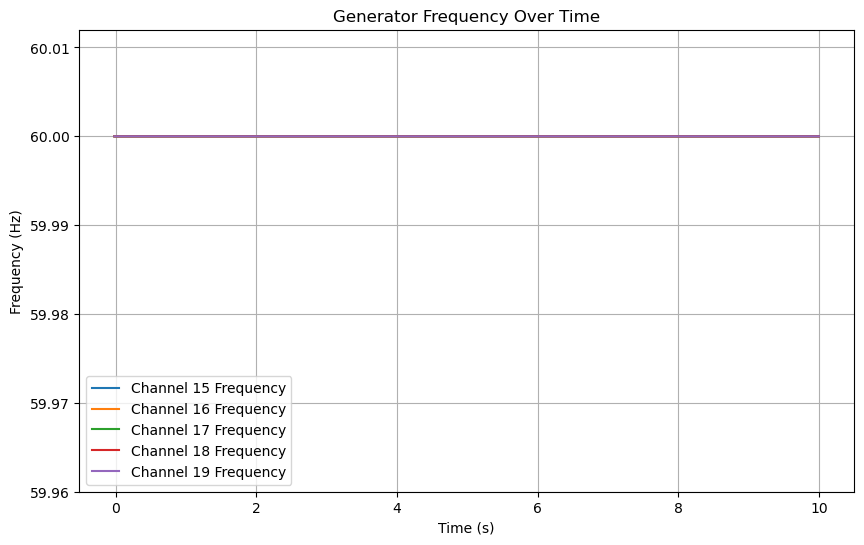

<module 'matplotlib.pyplot' from 'c:\\Users\\alexb\\miniconda3\\envs\\PSSe\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [5]:
output_file = "./simulation_output_file.out"
WecObj.psse.plot_simulation_results(output_file, channels=[15, 16, 17, 18, 19])

In [6]:
WecObj.psse.dataframe

,BUS_ID,Bus,BASE,PU,ANGLED,Type,P Gen,Q Gen,P Load,Q Load,P,Q,ΔP,ΔQ,M_Angle,M_Mag
0,1,BUS 1,69.0,1.030000,0.000000,3,81.448387,1.877563,NaN,NaN,81.448387,1.877563,-0.000003,-1.862645e-07,0.000003,-3.079174
1,2,BUS 2,69.0,1.019732,-1.603905,2,40.000000,15.000001,21.700001,12.700001,18.299999,2.300000,-0.006869,-1.229346e-05,0.006869,-3.139803
2,3,BUS 3,69.0,1.000516,-3.445127,2,40.000000,15.000001,50.000000,25.000000,-10.000000,-9.999999,0.004530,-5.148426e-02,0.051683,-1.483035
3,4,BUS 4,69.0,0.998643,-4.282281,1,NaN,NaN,47.799999,10.000000,-47.799999,-10.000000,-0.004336,8.419156e-04,0.004417,2.949821
4,5,BUS 5,69.0,1.004482,-3.686003,1,NaN,NaN,7.600000,1.600000,-7.600000,-1.600000,-0.000459,5.245209e-04,0.000697,2.289626
5,6,BUS 6,138.0,0.998789,-6.301197,2,30.000002,10.000000,15.000001,7.500000,15.000001,2.500000,0.001605,-2.754340e-03,0.003188,-1.043221
6,7,BUS 7,138.0,1.006917,-4.830858,1,NaN,NaN,NaN,NaN,NaN,NaN,-0.002089,3.185123e-05,0.002089,3.126345
7,8,BUS 8,69.0,1.019064,-1.398316,2,35.000000,10.000000,NaN,NaN,35.000000,10.000000,0.009462,-1.539513e-02,0.018071,-1.019692
8,9,BUS 9,138.0,1.002023,-7.306218,1,NaN,NaN,29.499998,16.600000,-29.499998,-16.600000,-0.005773,-2.037734e-03,0.006122,-2.802253
9,10,BUS 10,138.0,0.993597,-7.460652,1,NaN,NaN,9.000000,5.800000,-9.000000,-5.800000,-0.001428,-1.132488e-04,0.001432,-3.062427


In [23]:
WecObj.psse.get_values()
df = WecObj.psse.dataframe[["Bus", "PU", "M_Angle"]]
df["M_Angle_Degrees"] = df["M_Angle"] * (180 / np.pi)
df["M_Angle_Degrees"] = df["M_Angle_Degrees"].round(4)

# Convert to string to avoid scientific notation
df["M_Angle_Degrees"] = df["M_Angle_Degrees"].apply(lambda x: f"{x:.4f}")

# Your DataFrame now has the M_Angle values in degrees, rounded, and formatted as strings
df[["Bus", "PU", "M_Angle_Degrees"]]

c:\Users\alexb\miniconda3\envs\PSSe\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\alexb\miniconda3\envs\PSSe\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\alexb\miniconda3\envs\PSSe\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentat

,Bus,PU,M_Angle_Degrees
0,BUS 1,1.029987,0.0005
1,BUS 2,1.019716,0.0005
2,BUS 3,1.000479,0.0007
3,BUS 4,0.998621,0.0005
4,BUS 5,1.004463,0.0002
5,BUS 6,0.998779,0.0017
6,BUS 7,1.006896,0.0008
7,BUS 8,1.019045,0.0028
8,BUS 9,1.002002,0.0002
9,BUS 10,0.993577,0.0000


In [6]:
"""
This cell is used to import the required libraries and set up the PSSE environment,
this is a bit more complex than it should because of the way I developed WEC-GRID
"""

# import PSSE stuff
# Standard Libraries
import os
import sys
import time

# 3rd Party Libraries
import pandas as pd
import cmath
import matplotlib.pyplot as plt
import numpy as np

# local libraries
from WEC_GRID.utilities.util import read_paths
from WEC_GRID.viz.psse_viz import PSSEVisualizer

# Initialize the PATHS dictionary
PATHS = read_paths()
CURR_DIR = os.path.dirname(os.path.abspath("./"))

os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
psse_path = PATHS["psse"]
sys.path.extend(
    [
        os.path.join(psse_path, subdir)
        for subdir in ["PSSPY37", "PSSBIN", "PSSLIB", "EXAMPLE"]
    ]
)
os.environ["PATH"] = (
    os.path.join(psse_path, "PSSPY37")
    + ";"
    + os.path.join(psse_path, "PSSBIN")
    + ";"
    + os.path.join(psse_path, "EXAMPLE")
    + ";"
    + os.environ["PATH"]
)

import psse35

psse35.set_minor(3)
import psspy
import dyntools

psspy.psseinit(50)


_i = psspy.getdefaultint()
_f = psspy.getdefaultreal()
_s = psspy.getdefaultchar()

In [2]:
"""
Plotting Function for later use
"""
# Function to plot results from the simulation
def plot_simulation_results(output_file, channels):
    chnf_obj = dyntools.CHNF(output_file)
    _, channel_ids, channel_data = chnf_obj.get_data()
    base_frequency = 60.0  # Hz

    plt.figure(figsize=(10, 6))

    # Assuming channels for generator frequencies are correctly numbered

    for ch in channels:
        frequency_deviation = np.array(channel_data[ch])
        time_array = np.array(channel_data["time"])
        actual_frequency = 60.0 * (1 + frequency_deviation)

        plt.plot(time_array, actual_frequency, label=f"Channel {ch} Frequency")

    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.title("Generator Frequency Over Time")
    plt.legend()
    plt.grid(True)
    plt.ylim(59.96, 60.012)
    plt.show()
    return plt

In [12]:
case_file = "../models/grid_models/andes_IEEE14.raw"
psspy.read(1, case_file)
ibus = psspy.abusint(string="NUMBER")[1][0]

vmax_values = {}
vmin_values = {}

# Iterate through each bus to get their vmax and vmin
for bus in ibus:
    ierr = psspy.bus_data_4(
        ibus=bus, inode=0, intgar=[1, 1, 1, 1], realar=[_f, _f, _f, 1.1, 0.9, _f, _f]
    )


 Reading IC, SBASE, REV, XFRRAT, NXFRAT, BASFRQ...

 Converting RAW data from PSS(R)E 32 to PSS(R)E 33 format
 Starting processing of Case identification data records
 Finished processing of 3 records for Case identification data
 Starting processing of Bus data records
 Finished processing of 14 records for Bus data
 Starting processing of Load data records
 Finished processing of 11 records for Load data
 Starting processing of Fixed shunt data records
 Finished processing of 0 records for Fixed shunt data
 Starting processing of Generator data records
 Finished processing of 5 records for Generator data
 Starting processing of Branch data records
 Finished processing of 16 records for Branch data
 Starting processing of Transformer data records
 Finished processing of 16 records for 4 Transformer data
 Starting processing of Area data records
 Finished processing of 2 records for Area data
 Starting processing of Two-terminal dc data records
 Finished processing of 0 records for 0 

In [7]:
??psspy.bus_data_4

Signature:
psspy.bus_data_4(
    ibus=None,
    inode=None,
    intgar=None,
    realar=None,
    name=None,
    **kwds,
)
Docstring:
Use this API routine to modify the data of an existing bus in the working case, or to add a new
bus to the working case (see PSSE Program Operation Manual, Bus Data).

This API routine was first introduced in release 34.2.0.

Python syntax:
    ierr = bus_data_4(ibus, inode, intgar, realar, name)

Arguments:
    IBUS (integer): Bus number. (input; no default allowed).

    INODE (integer): Bus section node number. (input; no default allowed).

    INTGAR (integer):  An array of four elementsNone. (input).

    REALAR (real):  An array of seven elementsNone. (input).

    NAME (character*12): Bus name. (input; blank by default).

    IERR (integer): Error code. (output).

The argument INTGAR values are as follows:

==================  ============================================================================
==================  =========================

In [3]:
vmax_values

{1: None,
 2: None,
 3: None,
 4: None,
 5: None,
 6: None,
 7: None,
 8: None,
 9: None,
 10: None,
 11: None,
 12: None,
 13: None,
 14: None}


 Reading IC, SBASE, REV, XFRRAT, NXFRAT, BASFRQ...

 Converting RAW data from PSS(R)E 32 to PSS(R)E 33 format
 Starting processing of Case identification data records
 Finished processing of 3 records for Case identification data
 Starting processing of Bus data records
 Finished processing of 14 records for Bus data
 Starting processing of Load data records
 Finished processing of 11 records for Load data
 Starting processing of Fixed shunt data records
 Finished processing of 0 records for Fixed shunt data
 Starting processing of Generator data records
 Finished processing of 5 records for Generator data
 Starting processing of Branch data records
 Finished processing of 16 records for Branch data
 Starting processing of Transformer data records
 Finished processing of 16 records for 4 Transformer data
 Starting processing of Area data records
 Finished processing of 2 records for Area data
 Starting processing of Two-terminal dc data records
 Finished processing of 0 records for 0 

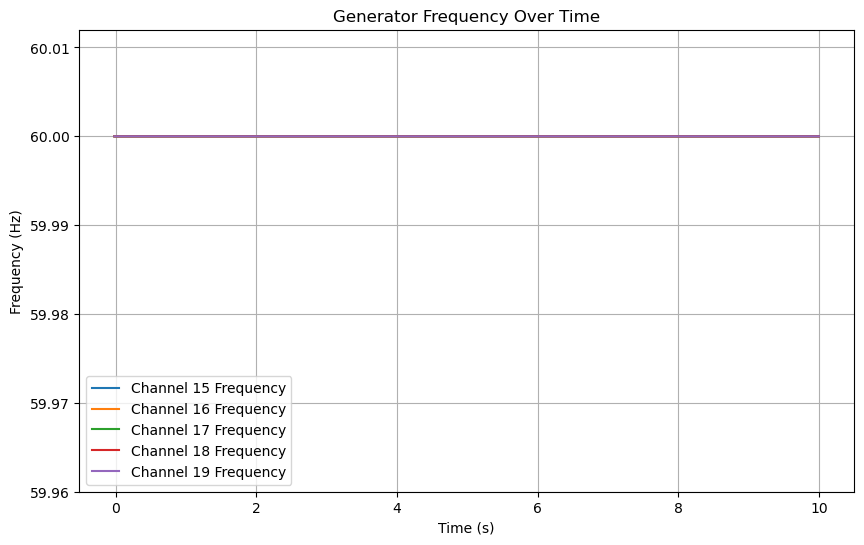

<module 'matplotlib.pyplot' from 'c:\\Users\\alexb\\miniconda3\\envs\\PSSe\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [3]:
"""
read in and simualtion cell
"""

import matplotlib.pyplot as plt
import numpy as np
import dyntools

# Define file paths
# case_file = "../models/grid_models/this_ieee14.raw"
# dyr_file = "../models/grid_models/ieee14.dyr"
# case_file = "../models/grid_models/11BUS KUNDUR.raw"
# dyr_file = "../models/grid_models/11BUS KUNDUR TGOV.dyr"

case_file = "../models/grid_models/andes_IEEE14.raw"
dyr_file = "../models/grid_models/andes_IEEE14.dyr"
solved_case = "solved_case.sav"
output_file = "./simulation_output_file.out"

# Load case and dynamic data, solve power flow
psspy.read(1, case_file)
psspy.dyre_new(dyrefile=dyr_file)
psspy.fnsl()
psspy.save(solved_case)

# Setup for dynamic simulation
psspy.cong(0)
psspy.ordr(0)
psspy.fact()
psspy.tysl(0)

# Add channels (e.g., bus voltage, machine speed)
psspy.chsb(sid=0, all=1, status=[-1, -1, -1, 1, 13, 0])  # Bus voltage
psspy.chsb(sid=0, all=1, status=[-1, -1, -1, 1, 7, 0])  # Machine speed
psspy.chsb(sid=0, all=1, status=[-1, -1, -1, 1, 1, 0])  # ANGLE
psspy.chsb(sid=0, all=1, status=[-1, -1, -1, 1, 12, 0])  # bus freq


# Start recording to output file and run dynamic simulation
psspy.strt(outfile=output_file)
end_time = 10  #
time_step = 0.01 / end_time  # Half-cycle step
for current_time in np.arange(0, end_time, time_step):
    psspy.run(tpause=current_time)
    # if current_time == 1.0:
    #     psspy.dist_branch_trip(1, 5, '1')
    # if current_time == 5.0:
    #     psspy.dist_branch_close(1, 5,'1')

psspy.save("final_state_after_dynamic_sim.sav")

# Call the plotting function
plot_simulation_results(output_file, channels=[15, 16, 17, 18, 19])


# output_raw_path = "./test_14.raw"
# psspy.rawd_2(0, 1, [1,1,1,0,0,0,0], 0, output_raw_path)
# output_dyr_path = "./test_14.dyr"
# psspy.dyre_new([1,1,1,1], output_dyr_path, "", "", "")


 Reading IC, SBASE, REV, XFRRAT, NXFRAT, BASFRQ...

 Converting RAW data from PSS(R)E 32 to PSS(R)E 33 format
 Starting processing of Case identification data records
 Finished processing of 3 records for Case identification data
 Starting processing of Bus data records
 Finished processing of 14 records for Bus data
 Starting processing of Load data records
 Finished processing of 11 records for Load data
 Starting processing of Fixed shunt data records
 Finished processing of 0 records for Fixed shunt data
 Starting processing of Generator data records
 Finished processing of 5 records for Generator data
 Starting processing of Branch data records
 Finished processing of 16 records for Branch data
 Starting processing of Transformer data records
 Finished processing of 16 records for 4 Transformer data
 Starting processing of Area data records
 Finished processing of 2 records for Area data
 Starting processing of Two-terminal dc data records
 Finished processing of 0 records for 0 

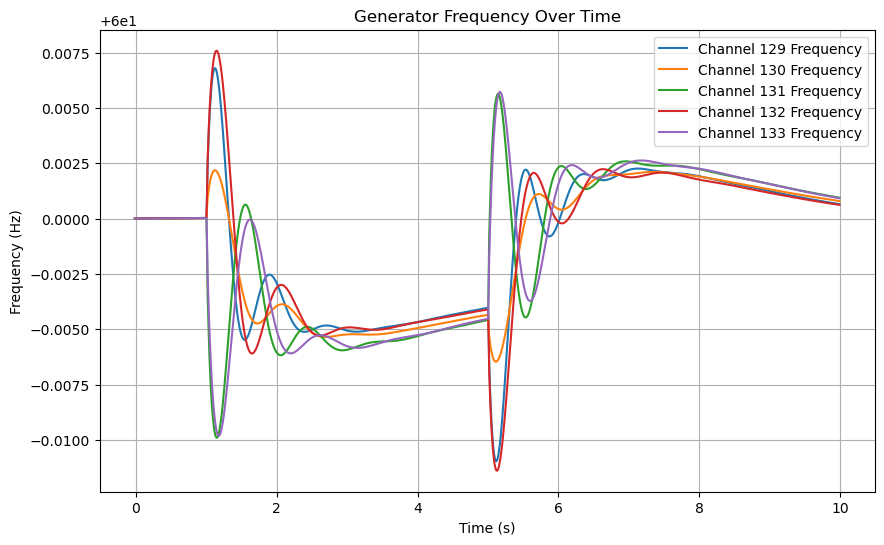

<module 'matplotlib.pyplot' from 'c:\\Users\\alexb\\miniconda3\\envs\\PSSe\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [39]:
"""
read in and simualtion cell for a line toggle
"""

import matplotlib.pyplot as plt
import numpy as np
import dyntools

# Define file paths
case_file = "../models/grid_models/andes_IEEE14.raw"
dyr_file = "../models/grid_models/andes_IEEE14.dyr"
solved_case = "solved_case.sav"
output_file = "./simulation_output_file.out"


# Load case and dynamic data, solve power flow
psspy.read(1, case_file)
psspy.dyre_new(dyrefile=dyr_file)
# psspy.fnsl()


# Setup for dynamic simulation
psspy.cong(0)
psspy.ordr(0)
psspy.fact()
psspy.tysl(0)

# Add channels (e.g., bus voltage, machine speed)
psspy.chsb(sid=0, all=1, status=[-1, -1, -1, 1, 13, 0])  # Bus voltage
psspy.chsb(sid=0, all=1, status=[-1, -1, -1, 1, 7, 0])  # Machine speed
psspy.chsb(sid=0, all=1, status=[-1, -1, -1, 1, 1, 0])  # ANGLE
psspy.chsb(sid=0, all=1, status=[-1, -1, -1, 1, 12, 0])  # bus freq


# # Start recording to output file and run dynamic simulation
psspy.strt(outfile=output_file)
# psspy.run(tpause=1)


# #psspy.dist_bus_fault(ibus=2)
# psspy.dist_branch_trip(1, 5, '1')

# time = 5
# psspy.run(tpause=time)

# #psspy.dist_clear_fault()
# psspy.dist_branch_close(1, 5,'1')

# time = 10
# psspy.run(tpause=time)


end_time = 10  #
time_step = 1 / 120
for current_time in np.arange(0, end_time, time_step):
    psspy.run(tpause=current_time)
    if current_time == 1.0:
        psspy.dist_branch_trip(4, 5, "1")
    if current_time == 5.0:
        psspy.dist_branch_close(4, 5, "1")

# for current_time in np.arange(0, end_time, time_step):
#     psspy.run(tpause=current_time)

#     # Introduce a fault at bus 2 at t=5.0 seconds
#     if current_time == 4.0:
#         psspy.dist_bus_fault(ibus=2)

#     # Clear the fault at t=5.2 seconds
#     if current_time == 4.2:
#         psspy.dist_clear_fault()

psspy.save("final_state_after_dynamic_sim.sav")
psspy.save(solved_case)


# Call the plotting function
plot_simulation_results(output_file, channels=[129, 130, 131, 132, 133])

# if os.path.exists(output_file):
#     os.remove(output_file)
# if os.path.exists(solved_case):
#     os.remove(solved_case)

In [40]:
chnf_obj = dyntools.CHNF(output_file)
_, channel_ids, channel_data = chnf_obj.get_data()

In [56]:
channel_ids

OrderedDict([('time', 'Time(s)'),
             (1, 'VOLT 1 [BUS1 69.000]'),
             (2, 'VOLT 2 [BUS2 69.000]'),
             (3, 'VOLT 3 [BUS3 69.000]'),
             (4, 'VOLT 4 [BUS4 69.000]'),
             (5, 'VOLT 5 [BUS5 69.000]'),
             (6, 'VOLT 6 [BUS6 138.00]'),
             (7, 'VOLT 7 [BUS7 138.00]'),
             (8, 'VOLT 8 [BUS8 69.000]'),
             (9, 'VOLT 9 [BUS9 138.00]'),
             (10, 'VOLT 10 [BUS10 138.00]'),
             (11, 'VOLT 11 [BUS11 138.00]'),
             (12, 'VOLT 12 [BUS12 138.00]'),
             (13, 'VOLT 13 [BUS13 138.00]'),
             (14, 'VOLT 14 [BUS14 138.00]'),
             (15, 'SPD 1[BUS1 69.000]1'),
             (16, 'SPD 2[BUS2 69.000]1'),
             (17, 'SPD 3[BUS3 69.000]1'),
             (18, 'SPD 6[BUS6 138.00]1'),
             (19, 'SPD 8[BUS8 69.000]1'),
             (20, 'ANGL 1[BUS1 69.000]1'),
             (21, 'ANGL 2[BUS2 69.000]1'),
             (22, 'ANGL 3[BUS3 69.000]1'),
             (23, 'ANGL 

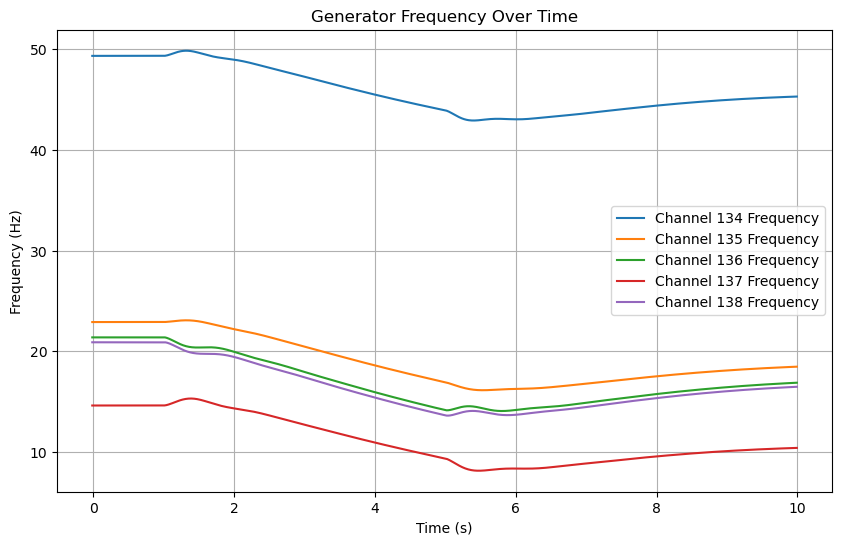

<module 'matplotlib.pyplot' from 'c:\\Users\\alexb\\miniconda3\\envs\\PSSe\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [45]:
134, 135, 136, 137, 138

# Call the plotting function
plot_simulation_results(output_file, channels=[134, 135, 136, 137, 138])

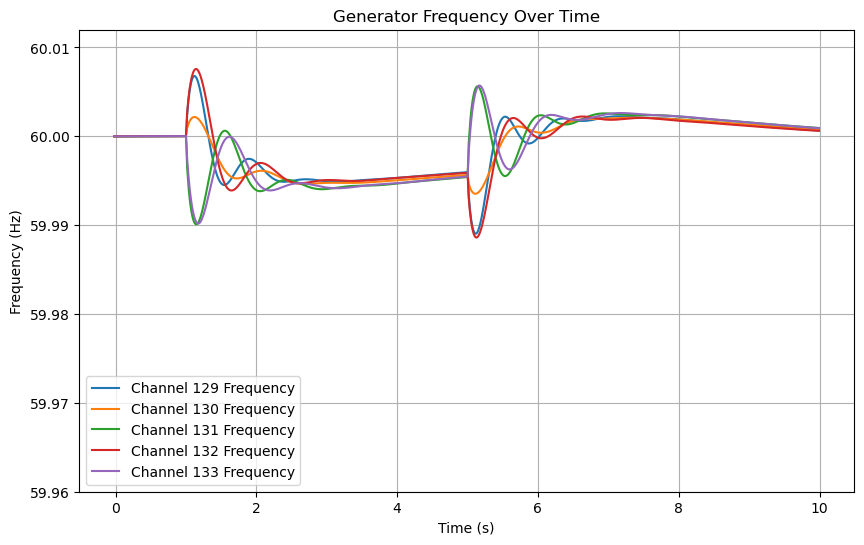

<module 'matplotlib.pyplot' from 'c:\\Users\\alexb\\miniconda3\\envs\\PSSe\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [55]:
# Call the plotting function
plot_simulation_results(output_file, channels=[129, 130, 131, 132, 133])